In [44]:
import os
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
# Set figure parameters
sc.set_figure_params(dpi=100, vector_friendly=True)
sns.set(style="ticks")
# vector_friendly=True rasterizes large objects (such as dots in a scatterplot as pixels).
# More at https://scanpy.readthedocs.io/en/stable/generated/scanpy.set_figure_params.html

There are several algorithms for spatial domain identification. In [Kang et al.](https://academic.oup.com/nar/article/53/7/gkaf303/8114322), the authors benchmarked several works and found GraphST to work best. 

![Kang et al. Figure 1](../images/gkaf303fig1.jpeg)

Overview of [GraphST](https://www.nature.com/articles/s41467-023-36796-3): 

![GraphST Figure 1](../images/graphST.png)

<u>Task:</u> 

Read processed data from last step, cluster with GraphST on one slide (or optionally, use PASTE first to align and then cluster with GrapST).  
Check issue: [GraphST with multiple samples, general question](https://github.com/JinmiaoChenLab/GraphST/issues/14)

[Link to GraphST tutorials](https://deepst-tutorials.readthedocs.io/)

In [4]:
## read processed data
data = sc.read("visium_v1_processed.h5ad")

In [9]:
import torch
from GraphST import GraphST

GraphST runs per slide. To run it across multiple slides, GraphST uses PASTE algorithm for alignment. In this tutorial, we'll use only one slide. 

In [11]:
data.obs["Slide_ID"].value_counts()

Slide_ID
V4_B    843
V5_D    752
V1_A    726
V3_C    722
V4_C    678
V2_D    676
V2_B    641
V6_D    619
V3_A    618
V6_C    590
V1_D    539
V6_B    521
V5_A    496
V3_D    481
V5_B    463
V5_C    402
V6_A    392
V4_D    367
V2_C    237
Name: count, dtype: int64

In [12]:
slide = "V4_B"
sub = data[data.obs["Slide_ID"]=="V4_B"]

In [13]:
device = "cpu" # we do not have GPU in this machine

In [15]:
model = GraphST.GraphST(sub, device=device)
sub = model.train()

Begin to train ST data...


100%|██████████| 600/600 [00:12<00:00, 49.24it/s]

Optimization finished for ST data!


In [19]:
sub.obsm

AxisArrays with keys: X_pca, X_pca_harmony, X_umap, spatial, distance_matrix, graph_neigh, adj, label_CSL, feat, feat_a, emb

"distance_matrix", "graph_neigh", "adj", "label_CSL", "feat", "feat_a" and "emb" are all addded by GraphST

In [16]:
radius = 30 # radius is used to aggegate the embeddings (see step 3 in the GraphST overview)

In [20]:
from GraphST.utils import clustering

Clustering based on GraphST embeddings requires number of clusters as a hyperparameter. In their paper, the authors choose different numbers for different experiments and for comparison with ground truths: "For tissue slices with manual annotation, we set the number of clusters to be the same as the ground truth". 

In [21]:
## we set number of clusters to be 8
n_clusters = 8

In [29]:
clustering(sub, n_clusters, radius=radius, method="leiden", start=0.1, end=2.0, increment=0.01)
# The resulting cluster labels are added to "domain" in .obs
# start and end are first and last resolution hyperparameter for search. See: https://github.com/JinmiaoChenLab/GraphST/blob/d62b0b7b6cd38ee285f3ac8cd67b7341a10bcc74/GraphST/utils.py#L11.

Searching resolution...
resolution=1.989999999999999, cluster number=15
resolution=1.979999999999999, cluster number=15
resolution=1.969999999999999, cluster number=14
resolution=1.959999999999999, cluster number=15
resolution=1.949999999999999, cluster number=14
resolution=1.939999999999999, cluster number=14
resolution=1.9299999999999993, cluster number=14
resolution=1.9199999999999993, cluster number=14
resolution=1.9099999999999993, cluster number=15
resolution=1.8999999999999992, cluster number=13
resolution=1.8899999999999992, cluster number=13
resolution=1.8799999999999992, cluster number=14
resolution=1.8699999999999992, cluster number=13
resolution=1.8599999999999992, cluster number=13
resolution=1.8499999999999992, cluster number=13
resolution=1.8399999999999992, cluster number=14
resolution=1.8299999999999992, cluster number=14
resolution=1.8199999999999992, cluster number=14
resolution=1.8099999999999992, cluster number=13
resolution=1.7999999999999992, cluster number=13
re

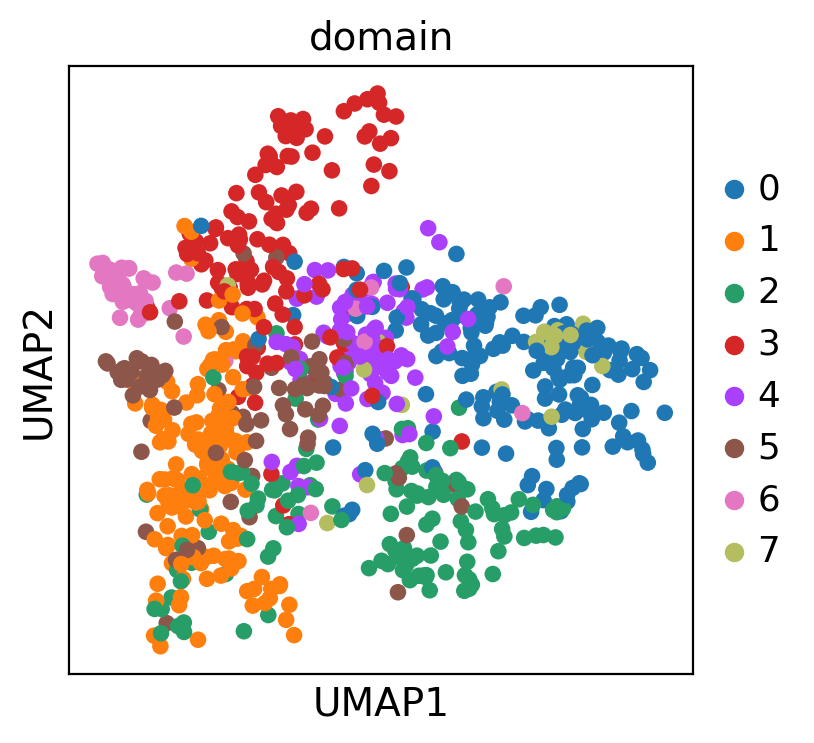

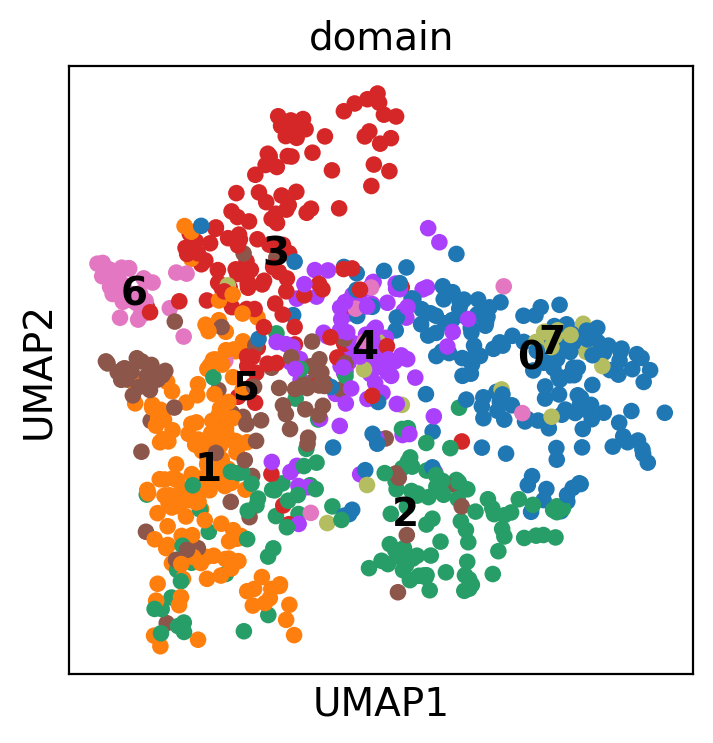

In [28]:
## Plot over UMAP the GraphST clusters
sc.pl.umap(sub, color="domain")
sc.pl.umap(sub, color="domain", legend_loc="on data")

/tmp/ipykernel_6507/264447520.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(sub, library_id=slide, color="domain")


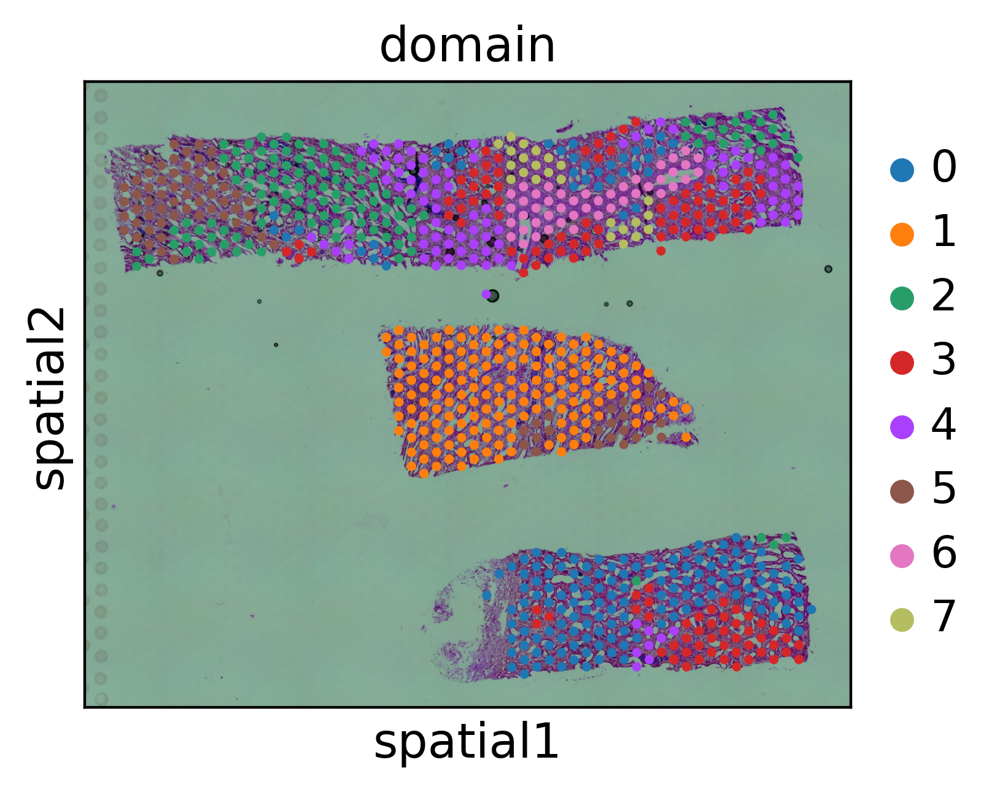

In [30]:
## Plot spatially
sc.set_figure_params(dpi=200)
sc.pl.spatial(sub, library_id=slide, color="domain")
sc.set_figure_params(dpi=100)

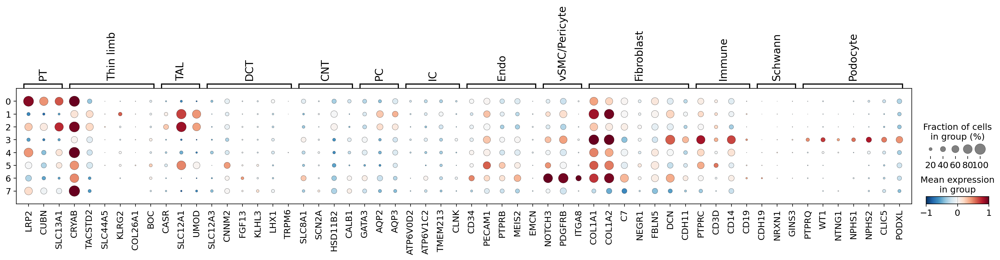

In [35]:
## Compare with known cell type markers (marker dictionary from JSON)

import json
with open("kidney_markers.json", "r") as fp:
    markers = json.load(fp)

sc.pl.dotplot(sub, var_names=markers, groupby="domain", layer="scaled",
                               vmin=-1, vmax=1, cmap="RdBu_r")

<Axes: xlabel='domain', ylabel='cluster'>

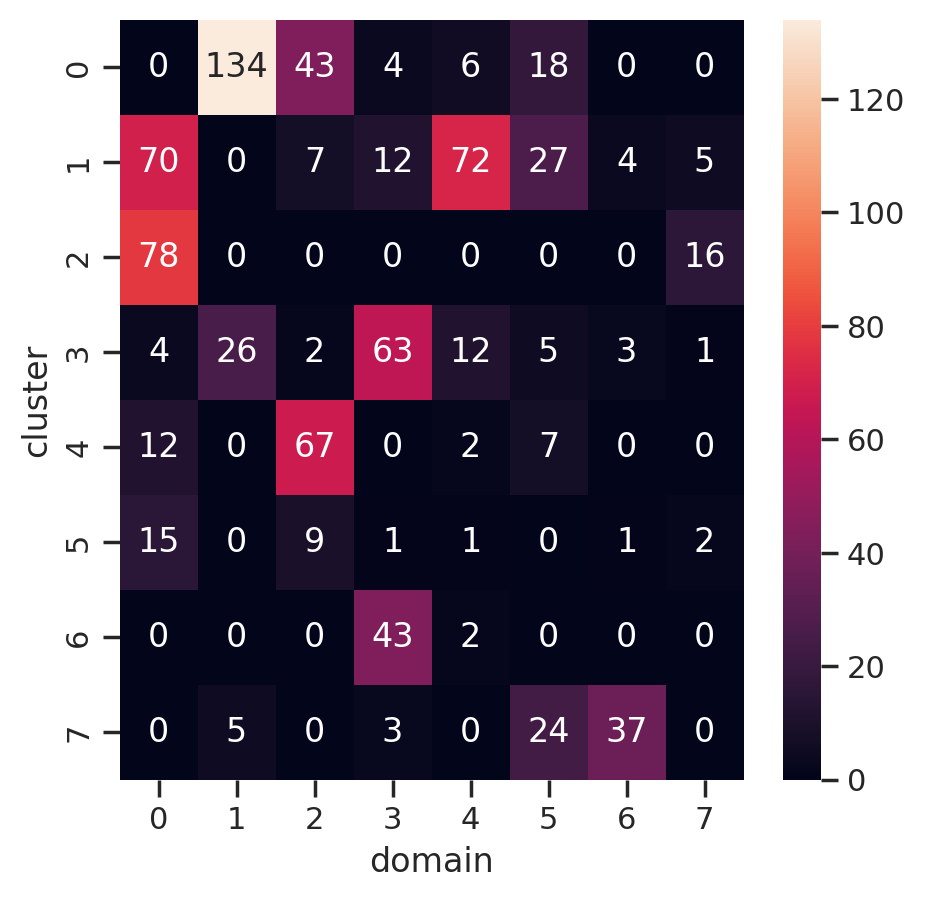

In [45]:
## Compare with leiden clustering with resolution 0.35 (saved in "cluster" in the previous step)

tab = pd.crosstab(sub.obs["cluster"], sub.obs["domain"])
plt.figure(figsize=(5,5))
sns.heatmap(tab, annot=True, fmt="d")

There is a very good overlap. This is general observation - Simple clustering works well for identifying spatial domains from Visium V1 and V2 data because spots are aggregates/neighborhoods of cells. Explains why GraphST, [MENDER](https://www.nature.com/articles/s41467-023-44367-9), [nichePCA](https://academic.oup.com/bioinformatics/article/41/1/btaf005/7945104) etc. which aggregate expression/latent features within a window perform quite similar to each other.


An advantage of GraphST is that it can take a single-cell reference data and provide deconvolution results (i.e. cell type proportions for each spot) on top of providing spatial domains.
    

We have a single-cell reference data from kidney at /shared/spatial-workshop-GCB-2025/kidney_sc.h5ad. This dataset comes from [Stewart et al., 2019](https://www.science.org/doi/10.1126/science.aat5031).

<u>Task:</u>

Perform cell type deconvolution with GraphST

## Cell type deconvolution with GrapST requires following steps:
1. preprocessing of single-cell data
2. preprocessing of spatial data
3. Computation of spot-to-spot interactive graphs (interaction graph is the distance between a spot and its three neighbors. See https://github.com/JinmiaoChenLab/GraphST/blob/d62b0b7b6cd38ee285f3ac8cd67b7341a10bcc74/GraphST/preprocess.py#L53
4. Construct contrastive label matrix. For all spots in the data, it will be [0,1]. See panel C in the GraphST overview figure above or go to https://github.com/JinmiaoChenLab/GraphST/blob/d62b0b7b6cd38ee285f3ac8cd67b7341a10bcc74/GraphST/preprocess.py#L121
5. Stores expression of all features (by default, all genes) in .obsm. Also, stores a permuted version.

In [53]:
data_sc = sc.read("kidney_sc.h5ad")

In [54]:
## preprocess single-cell data for GraphST 
## This runs following steps - 
# 1. compute 2000 highly_variable_genes
# 2. normalize_total to 10000
# 3. log-normalization and 
# 4. Scale data (without zero-centering) i.e. X/st-dev

GraphST.preprocess(data_sc)

In [63]:
## Deconvolution with GraphST also requires similar preprocessing of the spatial transcriptomics data
## Since the first three steps in GraphST.preprocess() are already performed, we only scale

sub.layers["logcounts"] = sub.X.copy() # store logcounts to not lose them
sc.pp.scale(sub, max_value=10, zero_center=False)

## Construct graph
GraphST.construct_interaction(sub)
GraphST.add_contrastive_label(sub)
GraphST.get_feature(sub)

/tmp/ipykernel_6507/1367780838.py:4: ImplicitModificationWarning: Setting element `.layers['logcounts']` of view, initializing view as actual.
  sub.layers["logcounts"] = sub.X.copy() # store logcounts to not lose them


In [64]:
from GraphST.preprocess import filter_with_overlap_gene
sub, data_sc = filter_with_overlap_gene(sub, data_sc) # selects the common genes out of highly variable genes in spatial and single-cell data

Number of overlap genes: 864


/data/projects/robin/xenium_multiview/xenium_cgn_1/lib/python3.11/site-packages/GraphST/preprocess.py:34: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns["overlap_genes"] = genes
/data/projects/robin/xenium_multiview/xenium_cgn_1/lib/python3.11/site-packages/GraphST/preprocess.py:35: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata_sc.uns["overlap_genes"] = genes


In [65]:
model = GraphST.GraphST(sub, data_sc, device=device, deconvolution=True)

In [66]:
sub, data_sc = model.train_map()

## train_map() calls train() and train_sc() first. https://github.com/JinmiaoChenLab/GraphST/blob/d62b0b7b6cd38ee285f3ac8cd67b7341a10bcc74/GraphST/GraphST.py#L224

Begin to train ST data...


100%|██████████| 600/600 [18:45<00:00,  1.88s/it]


Optimization finished for ST data!
Begin to train scRNA data...


100%|██████████| 600/600 [05:42<00:00,  1.75it/s]


Optimization finished for cell representation learning!
Begin to learn mapping matrix...


100%|██████████| 600/600 [10:25<00:00,  1.04s/it]

Mapping matrix learning finished!


In [72]:
sub.obsm["map_matrix"].shape # spot by cell matrix

(843, 40268)

In [70]:
data_sc.obs["cell_type"] = data_sc.obs["Cluster"].copy() # GraphST require cell type labels in cell_type column

The output of train_map() is a spot by cell matrix. The function project_cell_to_spot provides cell type proportions

1. Selects top-k values per spot (default 10%). Note: even if you change retain_percent to some other number, it won't change anything. There is a bug at https://github.com/JinmiaoChenLab/GraphST/blob/d62b0b7b6cd38ee285f3ac8cd67b7341a10bcc74/GraphST/utils.py#L169
2. construct cell type proportions per spot based on those top k values

In [75]:
from GraphST.utils import project_cell_to_spot
project_cell_to_spot(sub, data_sc, retain_percent=0.1)

In [76]:
celltypes = data_sc.obs["cell_type"].unique()

/tmp/ipykernel_6507/3188318788.py:3: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(sub, library_id=slide, color=celltypes, ncols=5, cmap="viridis")


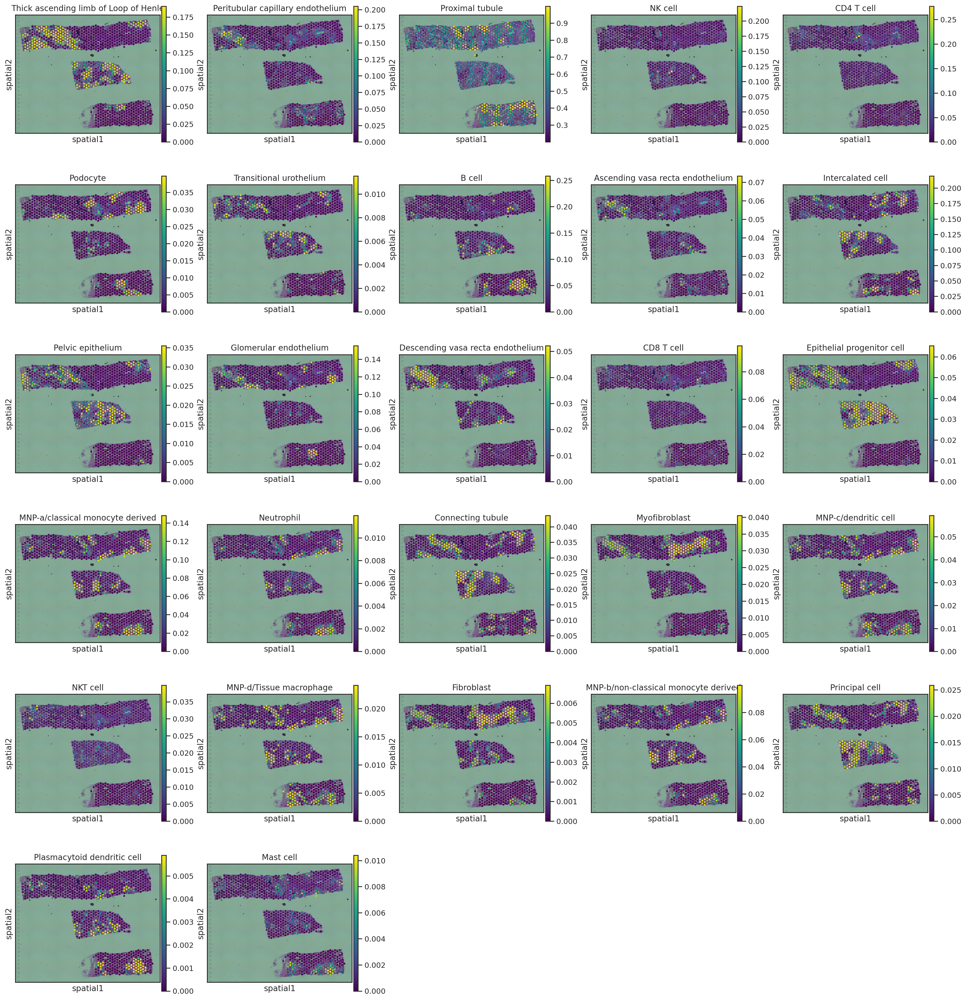

In [79]:
## Show cell type proportions

sc.pl.spatial(sub, library_id=slide, color=celltypes, ncols=5, cmap="viridis")

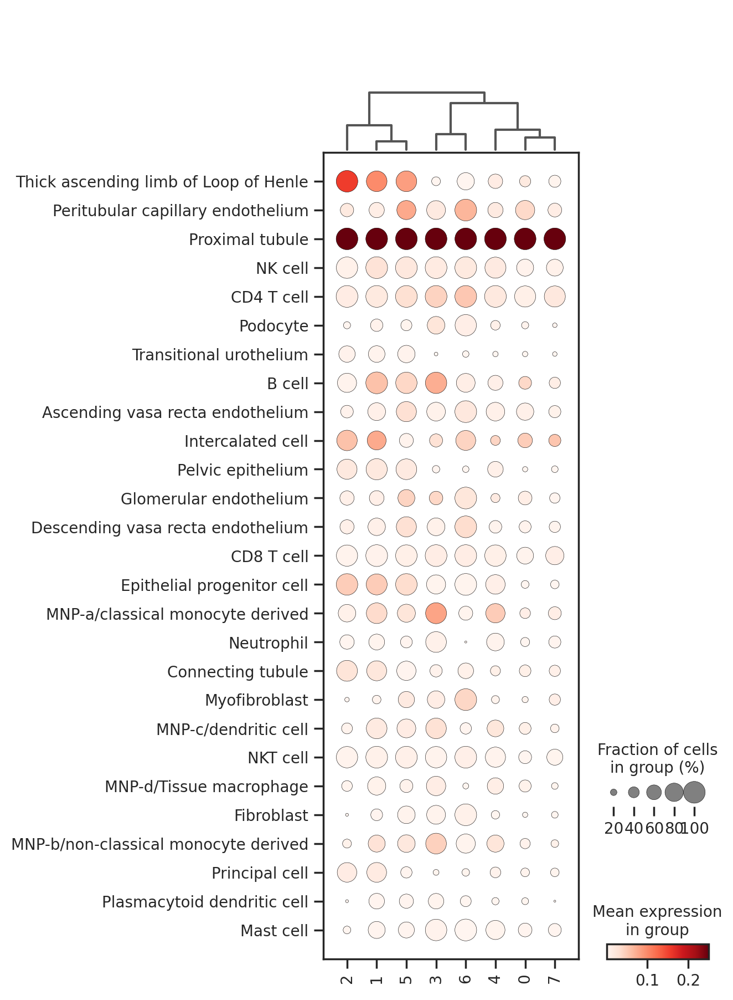

In [83]:
## Show cell type proportions of each domain

sc.pl.dotplot(sub, var_names=celltypes, groupby="domain", dendrogram=True, cmap="Reds", vmax=0.25, swap_axes=True)

In [92]:
props_scaled = pd.DataFrame(StandardScaler().fit_transform(sub.obs[celltypes]),
                            index=sub.obs.index,
                            columns=celltypes)

In [94]:
sub_1 = sub.copy()
for col in props_scaled.columns:
    sub_1.obs[col] = props_scaled[col]

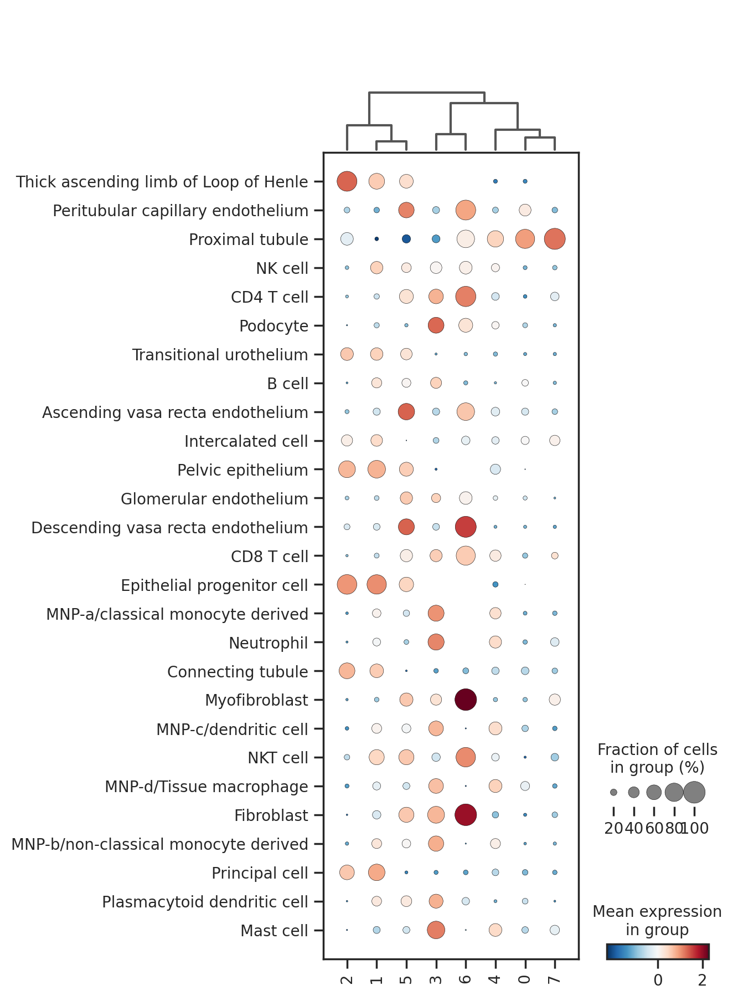

In [95]:
sc.pl.dotplot(sub_1, var_names=celltypes, groupby="domain", dendrogram=True, cmap="RdBu_r", vcenter=0, swap_axes=True)

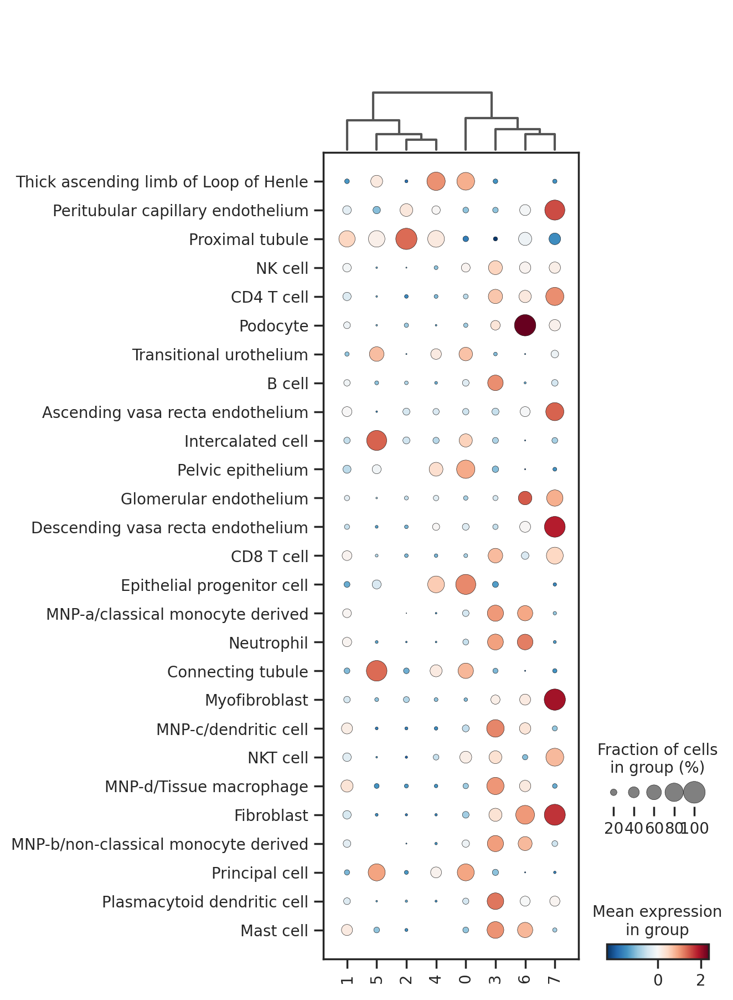

In [96]:
## show comparison with leiden clustering
sc.pl.dotplot(sub_1, var_names=celltypes, groupby="cluster", dendrogram=True, cmap="RdBu_r", vcenter=0, swap_axes=True)

<u>Task:</u>

How does the deconvolution results compare with published annotations done at lower resolution (load clustering: /home/shared/spatial-workshop-GCB-2025/visium_v1_compartments_gex.csv )


In [97]:
## save results
sub.write(f"{slide}_GraphST.h5ad")

<u>Task:</u>

Run [Mender](https://www.nature.com/articles/s41467-023-44367-9) on all slides as it allows for "easier" batch correction compared to GraphST, compare with complete leiden clustering, check homogeneity of markers and save the output. [Code](https://github.com/yuanzhiyuan/MENDER) and [Tutorial](https://mender-tutorial.readthedocs.io/en/latest/Visium_brain01.html).

You may need to install MENDER via `pip install --no-deps SOMENDER` because MENDER harcodes Seaborn to be version 0.12.2 which is incompatible with Scanpy version we have (or in genral scanpy>=1.10.x).